<a href="https://colab.research.google.com/github/rfarssi00/MASKD/blob/main/MASKD_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Détection de masque sanitaire à l'aide de Yolov4**

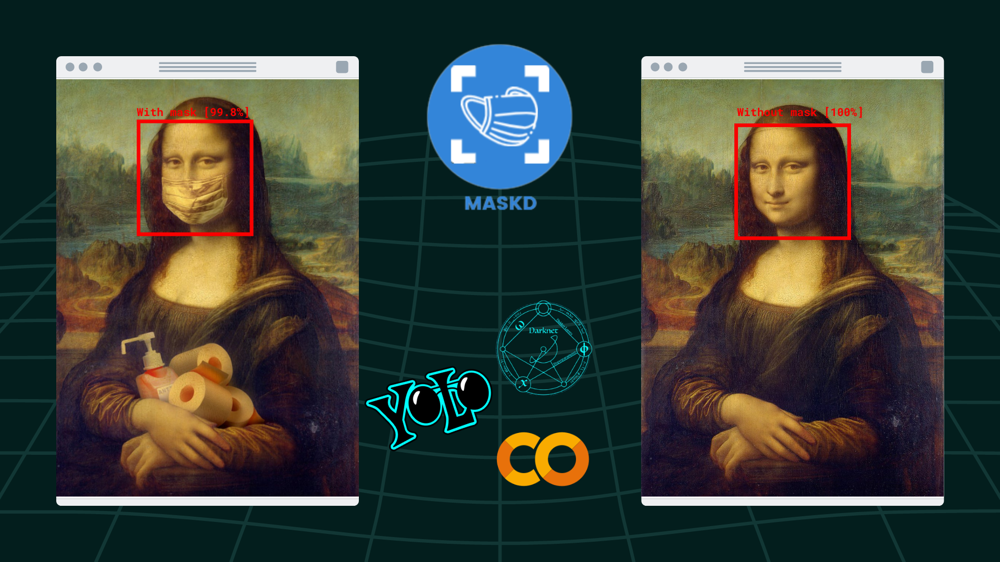

# **Contexte du projet**

Au début de l'année 2020, le monde a été confronté à la pandémie de coronavirus qui a changé notre société et continue de le faire. Lorsque les mesures COVID-19 ont été mises en place, l'une des premières mesures préventives recommandées par la plupart des autorités sanitaires a été le port d'un masque pour limiter l'exposition aux particules respiratoires.
Grâce à l’intelligence artificielle, nous pouvons construire des modèles pour aider à surveiller en temps réel la conformité du port des masques.

Notre projet intitulé **MASKD** est une solution qui va permettre de détecter quelles personnes portent ou non un masque de prévention CORONAVIRUS.


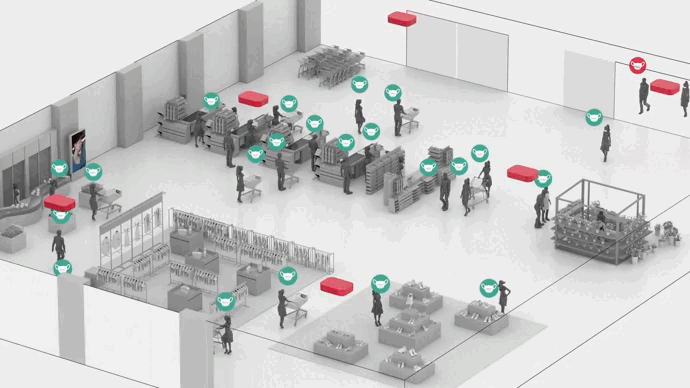

# **1) Création des dossiers *`yolov4`* et *`training`* dans notre drive**

Créons un dossier nommé ***yolov4*** dans notre drive. 
 
Ensuite, nous créons un autre dossier nommé ***training*** à l'intérieur du dossier ***yolov4***. C'est là où nous allons enregistrer nos poids entraînés (ce chemin est mentionné dans le fichier ***obj.data*** que nous téléchargerons plus tard).


# **2) Connectons le notebook à Google Drive, lions notre dossier et naviguons vers le dossier /mydrive/yolov4**

In [ ]:
#mount drive
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')

# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/gdrive/My\ Drive/ /mydrive

# list the contents of /mydrive
!ls /mydrive

#Navigate to /mydrive/yolov4
%cd /mydrive/yolov4

# **3) Créons un clone du répertoire git de `darknet`** 

In [ ]:
!git clone https://github.com/AlexeyAB/darknet

# **4) Créons et téléchargeons les fichiers suivants dont nous avons besoin pour former un détecteur personnalisé**


a.   `Dataset personnalisé labellisé` 

b.   `Fichier cfg personnalisé`

c.   `Fichiers obj.data et obj.names` 

d.   `Fichier process.py (pour créer les fichiers train.txt et test.txt pour l'entraînement)`


**Les fichiers personnalisés sont téléchargeables sur [GitHub](https://github.com/techzizou/yolov4-custom_Trainingg).
Nous travaillons avec 2 classes, à savoir with_mask et without_mask**




## **4(a) Téléchargeons le fichier obj.zip du dataset personnalisé et étiqueté dans le dossier yolov4 de notre drive.**


Créons le fichier zip **obj.zip** à partir du dossier **obj** contenant à la fois les fichiers ".jpg" de l'image d'entrée et les fichiers ".txt" correspondants au format YOLO étiquetés.

Téléchargeons le fichier zip dans le dossier **yolov4** sur notre drive.

## **4(b) Créons notre fichier de configuration personnalisé et téléchargeons-le sur notre drive**

Téléchargeons le fichier **yolov4-custom.cfg** du répertoire ***darknet/cfg***, modifions-le et importons-le dans le dossier ***yolov4*** de notre drive.

Nous pouvons également télécharger le fichier de configuration personnalisé à partir de [AlexeyAB Github](https://www.github.com/AlexeyAB/darknet)


**Nous devons apporter les modifications suivantes dans notre fichier de configuration personnalisé :**

*   changer la ligne batch en batch=64
*   changer la ligne de subdivisions en subdivisions=16
*   changer la ligne max_batches en (classes*2000 mais pas moins que le nombre d'images d'entraînement et pas moins que 6000), par exemple max_batches=6000 si vous vous entraînez pour 3 classes
*    changer la ligne steps à 80% et 90% de max_batches, steps=4800,5400
*    fixer network size width=416 height=416 ou toute valeur multiple de 32
*    remplacez la ligne classes=80 par votre nombre d'objets dans chacune des 3 couches [yolo].
*    remplacez [filters=255] par filters=(classes + 5)x3 dans les 3 [convolutional] avant chaque couche [yolo], gardez à l'esprit qu'il doit s'agir uniquement de la dernière [convolution] avant chacune des couches [yolo].
     Donc, si classes=1, il faut écrire filters=18. Si classes=2 alors écrivez filtres=21.



## **4(c) Créons nos fichiers *`obj.data`* et *`obj.names`* et téléchargeons-les sur notre drive**



### **obj.data**

```
classes = 2
train  = data/train.txt
valid  = data/test.txt
names = data/obj.names
backup = /mydrive/yolov4/training

```




### **obj.names**




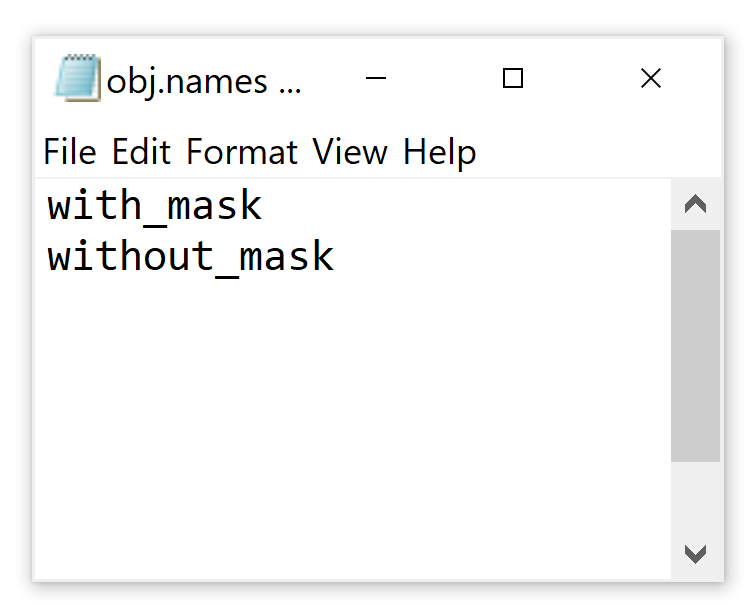


## **4(d) Téléchargeons le fichier script *`process.py`* dans le dossier yolov4 de notre drive**

**Pour diviser tous les fichiers d'images en deux parties: 90% pour l'entraînement et 10% pour le test.**

Ce script *`process.py`* crée les fichiers *`train.txt`* & *`test.txt`* où le fichier *`train.txt`* a les chemins vers 90% des images et *`test.txt`* a les chemins vers 10% des images.

Vous pouvez télécharger le script ***`process.py`*** à partir de [GitHub](https://github.com/techzizou/yolov4-custom_Training).

# **5) Effectuons les changements dans le `makefile` pour activer OPENCV et GPU**

In [ ]:
# change makefile to have GPU and OPENCV enabled
# also set CUDNN, CUDNN_HALF and LIBSO to 1

%cd darknet/
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!sed -i 's/LIBSO=0/LIBSO=1/' Makefile

# **6) Lançons la commande `make` pour construire darknet**

In [ ]:
# build darknet 
!make

# **7) Copions tous les fichiers du dossier *`yolov4`* dans le répertoire darknet**

In [ ]:
# Clean the data and cfg folders first except the labels folder in data which is required

%cd data/
!find -maxdepth 1 -type f -exec rm -rf {} \;
%cd ..

%rm -rf cfg/
%mkdir cfg

In [ ]:
# Unzip the obj.zip dataset and its contents so that they are now in /darknet/data/ folder 

!unzip /mydrive/yolov4/obj.zip -d data/

In [ ]:
# Copy the yolov4-custom.cfg file so that it is now in /darknet/cfg/ folder 

!cp /mydrive/yolov4/yolov4-custom.cfg cfg

# verify if your custom file is in cfg folder
!ls cfg/

In [ ]:
# Copy the obj.names and obj.data files from your drive so that they are now in /darknet/data/ folder 

!cp /mydrive/yolov4/obj.names data
!cp /mydrive/yolov4/obj.data  data

# verify if the above files are in data folder
!ls data/

In [ ]:
# Copy the process.py file to the current darknet directory 

!cp /mydrive/yolov4/process.py .

# **8) Exécutons le script python *`process.py`* pour créer les fichiers *`train.txt`* et *`test.txt`* dans le dossier *data***

In [ ]:
# run process.py ( this creates the train.txt and test.txt files in our darknet/data folder )
!python process.py

# list the contents of data folder to check if the train.txt and test.txt files have been created 
!ls data/

# **9) Téléchargeons les poids pré-entraînés de *`yolov4`***

In [ ]:
# Download the yolov4 pre-trained weights file
!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.conv.137

# **10) ENTRAÎNEMENT**

## **Entraînons notre détecteur personnalisé** 

Pour obtenir de meilleurs résultats, nous devons arrêter l'entraînement lorsque la perte moyenne est inférieure à 0.05 si possible ou au moins inférieure à 0.3, sinon entraînons le modèle jusqu'à ce que la perte moyenne ne montre aucun changement significatif pendant un certain temps.

In [ ]:
# train your custom detector! (uncomment %%capture below if you run into memory issues or your Colab is crashing)
# %%capture

!./darknet detector train data/obj.data cfg/yolov4-custom.cfg yolov4.conv.137 -dont_show -map

In [ ]:
# This stops 'Run all' at this cell by causing an error
assert False

### **<ins>NOTE</ins>:** Si vous êtes déconnecté ou si vous perdez votre session pour une raison quelconque, vous devez exécuter les étapes 2, 5 et 6 à nouveau pour monter le disque, éditer le makefile et construire darknet à chaque fois, sinon l'exécutable darknet ne fonctionnera pas.

## **Pour redémarrer votre entraînement (au cas où l'entraînement ne se termine pas et que vous soyez déconnecté)**

Si vous êtes déconnecté ou si vous perdez votre session, vous n'avez pas besoin de recommencer l'entraînement de votre modèle depuis le début. Vous pouvez reprendre l'entraînement là où vous l'avez laissé. Utilisez les poids qui ont été enregistrés en dernier. Les poids sont enregistrés toutes les 100 itérations sous le nom de ***yolov4-custom_last.weights*** dans le dossier ***yolov4/training*** sur votre disque. (Le chemin que nous avons donné comme backup dans le fichier "obj.data")



### **Donc, pour redémarrer l'entraînement, exécuter uniquement les étapes 2, 5 et 6, puis exécutez la commande suivante**

In [ ]:
#to restart training your custom detector where you left off(using the weights that were saved last)

!./darknet detector train data/obj.data cfg/yolov4-custom.cfg /mydrive/yolov4/training/yolov4-custom_last.weights -dont_show -map


## **Utiliser cette astuce pour Auto-Click afin d'éviter d'être exclu de Colab VM**

Appuyer sur (Ctrl + Shift + i) . Aller dans la console. Coller le code suivant et appuyez sur Entrée.

```
function ClickConnect(){
console.log("Working"); 
document
  .querySelector('#top-toolbar > colab-connect-button')
  .shadowRoot.querySelector('#connect')
  .click() 
}
setInterval(ClickConnect,60000)
```


# **11) Vérification des performances** 



In [ ]:
# define helper function imShow
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()


**Vérifions le tableau d'entraînement**

In [ ]:
#only works if the training does not get interrupted
imShow('chart.png')

**Vérifions la mAP (mean average precision)**

In [ ]:
##You can check the mAP for all the saved weights to see which gives the best results ( xxxx here is the saved weight number like 4000, 5000 or 6000 snd so on )

!./darknet detector map data/obj.data cfg/yolov4-custom.cfg /mydrive/yolov4/training/yolov4-custom_4000.weights -points 0

# **12) Testons notre détecteur personnalisé**

## **Apportons des modifications à notre fichier de configuration personnalisé**
*   changer la ligne batch en batch=1
*   changer la ligne de subdivisions en subdivisions=1

Nous pouvons le faire soit manuellement, soit en exécutant simplement le code ci-dessous

In [ ]:
#set your custom cfg to test mode 
%cd cfg
!sed -i 's/batch=64/batch=1/' yolov4-custom.cfg
!sed -i 's/subdivisions=16/subdivisions=1/' yolov4-custom.cfg
%cd ..

## **Lançons le détecteur sur une image**

In [ ]:
# run your custom detector with this command (upload an image to your google drive to test, the thresh flag sets the minimum accuracy required for object detection)

!./darknet detector test data/obj.data cfg/yolov4-custom.cfg /mydrive/yolov4/training/yolov4-custom_best.weights /mydrive/mask_test_images/image1.jpg -thresh 0.3 
imShow('predictions.jpg')

## **Lançons le détecteur sur une image de webcam**

In [ ]:
#run detector on images captured by webcam for your custom YOLOv4 trained model
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

!./darknet detector test data/obj.data cfg/yolov4-custom.cfg /mydrive/yolov4/training/yolov4-custom_best.weights photo.jpg -thresh 0.5
imShow('predictions.jpg')   

## **Lançons le détecteur sur une vidéo**

In [ ]:
# run your custom detector on a video with this command (upload a video to your google drive to test, the thresh flag sets the minimum accuracy required for object detection).This saves the output video with the detections in your output path

!./darknet detector demo data/obj.data cfg/yolov4-custom.cfg /mydrive/yolov4/training/yolov4-custom_best.weights -dont_show /mydrive/mask_test_videos/test3.mp4 -i 0 -out_filename /mydrive/mask_test_videos/finalresult.avi 

## **Lançons le détecteur sur une webcam en direct**

In [ ]:
# Code from theAIGuysCode Github (https://github.com/theAIGuysCode/YOLOv4-Cloud-Tutorial/blob/master/yolov4_webcam.ipynb)
# Adjusted for my custom YOLOv4 trained weights, config and obj.data files

# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time
import matplotlib.pyplot as plt
%matplotlib inline


# import darknet functions to perform object detections
from darknet import *
# load in our YOLOv4 architecture network
network, class_names, class_colors = load_network("cfg/yolov4-custom.cfg", "data/obj.data", "/mydrive/yolov4/training/yolov4-custom_best.weights")
width = network_width(network)
height = network_height(network)

# darknet helper function to run detection on image
def darknet_helper(img, width, height):
  darknet_image = make_image(width, height, 3)
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img_resized = cv2.resize(img_rgb, (width, height),
                              interpolation=cv2.INTER_LINEAR)

  # get image ratios to convert bounding boxes to proper size
  img_height, img_width, _ = img.shape
  width_ratio = img_width/width
  height_ratio = img_height/height

  # run model on darknet style image to get detections
  copy_image_from_bytes(darknet_image, img_resized.tobytes())
  detections = detect_image(network, class_names, darknet_image)
  free_image(darknet_image)
  return detections, width_ratio, height_ratio

# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes  

# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0 
while True:
    js_reply = video_frame(label_html, bbox)
    if not js_reply:
        break

    # convert JS response to OpenCV Image
    frame = js_to_image(js_reply["img"])

    # create transparent overlay for bounding box
    bbox_array = np.zeros([480,640,4], dtype=np.uint8)

    # call our darknet helper on video frame
    detections, width_ratio, height_ratio = darknet_helper(frame, width, height)

    # loop through detections and draw them on transparent overlay image
    for label, confidence, bbox in detections:
      left, top, right, bottom = bbox2points(bbox)
      left, top, right, bottom = int(left * width_ratio), int(top * height_ratio), int(right * width_ratio), int(bottom * height_ratio)
      bbox_array = cv2.rectangle(bbox_array, (left, top), (right, bottom), class_colors[label], 2)
      bbox_array = cv2.putText(bbox_array, "{} [{:.2f}]".format(label, float(confidence)),
                        (left, top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5,
                        class_colors[label], 2)

    bbox_array[:,:,3] = (bbox_array.max(axis = 2) > 0 ).astype(int) * 255
    # convert overlay of bbox into bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    # update bbox so next frame gets new overlay
    bbox = bbox_bytes   

### References

https://www.kaggle.com/techzizou/labeled-mask-dataset-yolo-darknet 

https://medium.com/analytics-vidhya/train-a-custom-yolov4-object-detector-using-google-colab-61a659d4868


**ラフマ**



